# Repaying the Credit

▪ If the applicant is likely to repay the loan, then disapproving the loan may result in a loss of business to the firm.
▪ If the applicant is not likely to repay the loan, that is if the applicant is a defaulter, then approving the loan may lead to a financial loss to the firm.
#### As an analyst, you need to analyze the patterns present in the data of Gold Atlantis in order to ensure that the applicants can repay the credit. The analysis will help the firm to provide loans to those customers who have a non-existent credit history but have a lower probability of becoming a defaulter.

In [ ]:
import pandas as pd 
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


In [ ]:
copy=pd.read_csv('data (2).csv')

### Creating a copy of data frame

In [ ]:
df=copy

In [ ]:
df.shape

(100000, 24)

In [ ]:
df.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'GENDER', 'Car', 'House',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'DAYS_EMPLOYED', 'MOBILE', 'WORK_PHONE',
       'HOME_PHONE', 'MOBILE_REACHABLE', 'FLAG_EMAIL', 'OCCUPATION_TYPE',
       'CNT_FAM_MEMBERS', 'APPLICATION_DAY', 'TOTAL_DOC_SUBMITTED'],
      dtype='object')

In [ ]:
df.isnull().sum()

SK_ID_CURR                 0
TARGET                     0
NAME_CONTRACT_TYPE         0
GENDER                     0
Car                        0
House                      0
CNT_CHILDREN               0
AMT_INCOME_TOTAL           0
AMT_CREDIT                 0
AMT_GOODS_PRICE           81
NAME_TYPE_SUITE          405
NAME_INCOME_TYPE           0
NAME_EDUCATION_TYPE        0
NAME_FAMILY_STATUS         0
DAYS_EMPLOYED              0
MOBILE                     0
WORK_PHONE                 0
HOME_PHONE                 0
MOBILE_REACHABLE           0
FLAG_EMAIL                 0
OCCUPATION_TYPE        31224
CNT_FAM_MEMBERS            1
APPLICATION_DAY            0
TOTAL_DOC_SUBMITTED        0
dtype: int64

In [ ]:
for x in df:
    print(x,df[x].nunique())

SK_ID_CURR 100000
TARGET 2
NAME_CONTRACT_TYPE 2
GENDER 3
Car 2
House 2
CNT_CHILDREN 12
AMT_INCOME_TOTAL 1212
AMT_CREDIT 4162
AMT_GOODS_PRICE 623
NAME_TYPE_SUITE 7
NAME_INCOME_TYPE 8
NAME_EDUCATION_TYPE 5
NAME_FAMILY_STATUS 6
DAYS_EMPLOYED 9871
MOBILE 2
WORK_PHONE 2
HOME_PHONE 2
MOBILE_REACHABLE 2
FLAG_EMAIL 2
OCCUPATION_TYPE 18
CNT_FAM_MEMBERS 12
APPLICATION_DAY 7
TOTAL_DOC_SUBMITTED 5


In [ ]:
cat=[]
con=[]
for x in df:
    if x!='SK_ID_CURR':
        if df[x].nunique()<50:
            cat.append(x)
        else:
            con.append(x)
    else:
        continue
print(cat,con)            

['TARGET', 'NAME_CONTRACT_TYPE', 'GENDER', 'Car', 'House', 'CNT_CHILDREN', 'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE', 'NAME_FAMILY_STATUS', 'MOBILE', 'WORK_PHONE', 'HOME_PHONE', 'MOBILE_REACHABLE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS', 'APPLICATION_DAY', 'TOTAL_DOC_SUBMITTED'] ['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE', 'DAYS_EMPLOYED']


In [ ]:
print(len(cat))

19


### Evaluate null value for amount good price

In [ ]:
a=df[['NAME_CONTRACT_TYPE','TARGET']][df['AMT_GOODS_PRICE'].isnull()]
a.value_counts()

NAME_CONTRACT_TYPE  TARGET
Revolving loans     0         73
                    1          8
dtype: int64

In [ ]:
a1=a['TARGET'][df['NAME_CONTRACT_TYPE']=='Revolving loans']
a2=a1.value_counts()
a2

0    73
1     8
Name: TARGET, dtype: int64

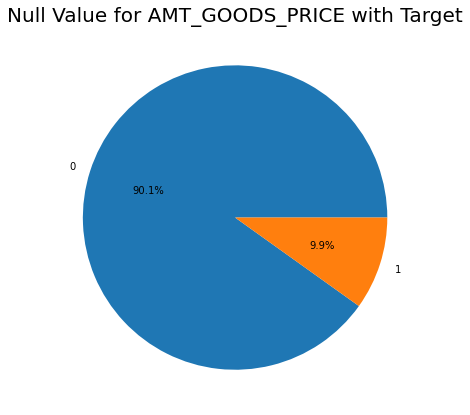

In [ ]:
fig,ax=plt.subplots(figsize=(15,7))
plt.pie(x=a2.values,labels=a2.index,autopct="%0.01f%%")
plt.title('Null Value for AMT_GOODS_PRICE with Target',fontsize=20)
plt.show()

### There is higher probability of repayment that applicants with No enteries in AMT_GOODS_PRICE 

In [ ]:
a3=df[['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE']][(df['NAME_CONTRACT_TYPE']=='Revolving loans')&(df['TARGET']==1)&(df['AMT_GOODS_PRICE'].notnull())]
print('AMT_CREDIT Correlation AMT_INCOME_TOTAL')
cor=a3['AMT_CREDIT'].corr(a3['AMT_INCOME_TOTAL'])
print('R = ',cor)
print('AMT_CREDIT Correlation AMT_GOODS_PRICE')
cor1=a3['AMT_CREDIT'].corr(a3['AMT_GOODS_PRICE'])
print('R = ',cor1)
print('AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE')
cor1=a3['AMT_INCOME_TOTAL'].corr(a3['AMT_GOODS_PRICE'])
print('R = ',cor1)

AMT_CREDIT Correlation AMT_INCOME_TOTAL
R =  0.48000157307305935
AMT_CREDIT Correlation AMT_GOODS_PRICE
R =  0.9910428379052822
AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE
R =  0.4855264073268979


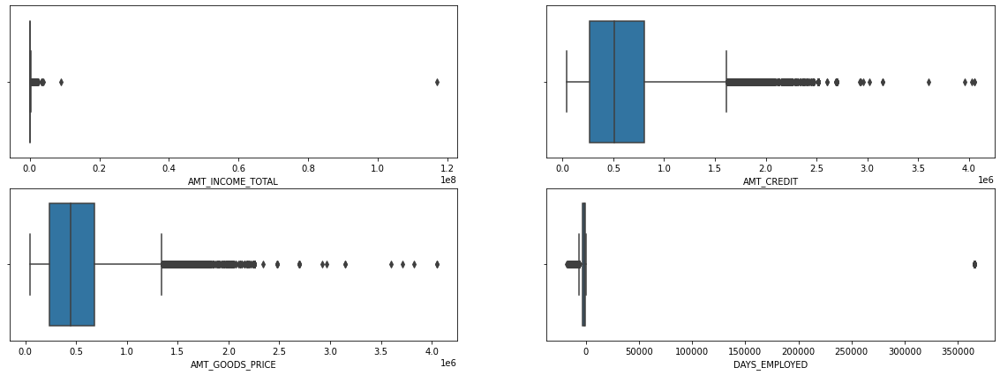

In [ ]:
fig,ax=plt.subplots(2,2,figsize=(20,7))
sns.boxplot(data=df,x='AMT_INCOME_TOTAL',ax=ax[0,0])
sns.boxplot(data=df,x='AMT_CREDIT',ax=ax[0,1])
sns.boxplot(data=df,x='AMT_GOODS_PRICE',ax=ax[1,0])
sns.boxplot(data=df,x='DAYS_EMPLOYED',ax=ax[1,1])
plt.show()

### Outlier Count |

In [ ]:
uf=[]
lf=[]
count=[]
index=[]
for x in con:
    cnt=0
    q1=df[x].describe()[4]
    q3=df[x].describe()[6]
    iqr=q3-q1
    l=q1-(1.5*iqr)
    u=q3+(1.5*iqr)
    lf.append(l)
    uf.append(u)
    for y in df[x]:
        if y < l or y > u:
            cnt=cnt+1
            a=df[x].index[df[x]==y]
            index.append(a)
        else:
            continue
    count.append(cnt)

outlier_data=pd.DataFrame({'Name':con,'Lower_Fence':lf,'Upper_Fence':uf,'Count':count})          
print(outlier_data)
print(len(index))

               Name  Lower_Fence  Upper_Fence  Count
0  AMT_INCOME_TOTAL     -22500.0     337500.0   4571
1        AMT_CREDIT    -537975.0    1616625.0   2155
2   AMT_GOODS_PRICE    -423000.0    1341000.0   4836
3     DAYS_EMPLOYED      -6458.5       3409.5  23451
35013


# With outlier

In [ ]:
df=df.drop(columns=['DAYS_EMPLOYED'])
df.shape

(100000, 23)

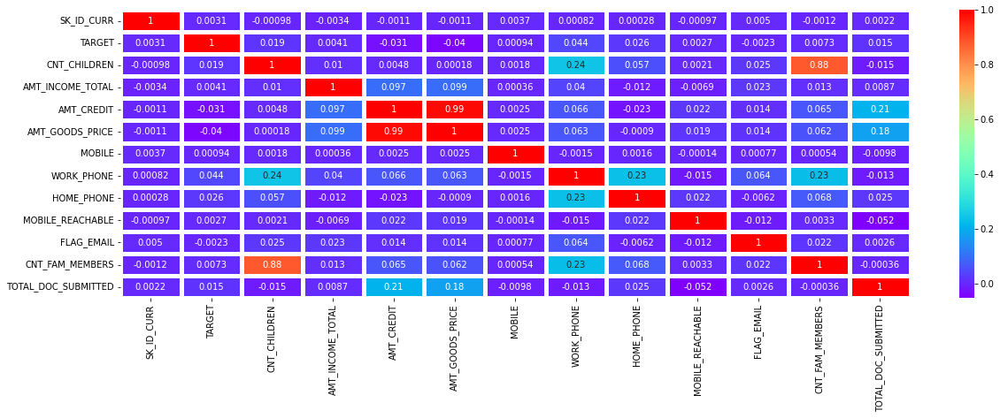

In [ ]:
fig,ax=plt.subplots(figsize=(20,6))
sns.heatmap(df.corr(),cmap='rainbow',annot=True,linewidth=5)
plt.show()

# From the Heat map we interpreted the following:
Strong positive  relation between (‘AMT_GOODS_PRICE’ & ‘AMT_CREDIT’)  and (‘CNT_FAM_MEMBERS’&’CNT_CHILDREN’)
Positive relation between(‘CNT_CHIDREN’&’WORK_PHONE’)  ,(‘WORK_PHONE&HOME_PHONE’),(TOTAL_DOC_SUBMITTED& ‘AMT_CREDIT’& ‘AMT_GOODS_PRICE’) )


AMT_CREDIT Correlation AMT_INCOME_TOTAL
R =  0.40410884694709603
AMT_CREDIT Correlation AMT_GOODS_PRICE
R =  0.9872727398329133
AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE
R =  0.406219313867337


C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


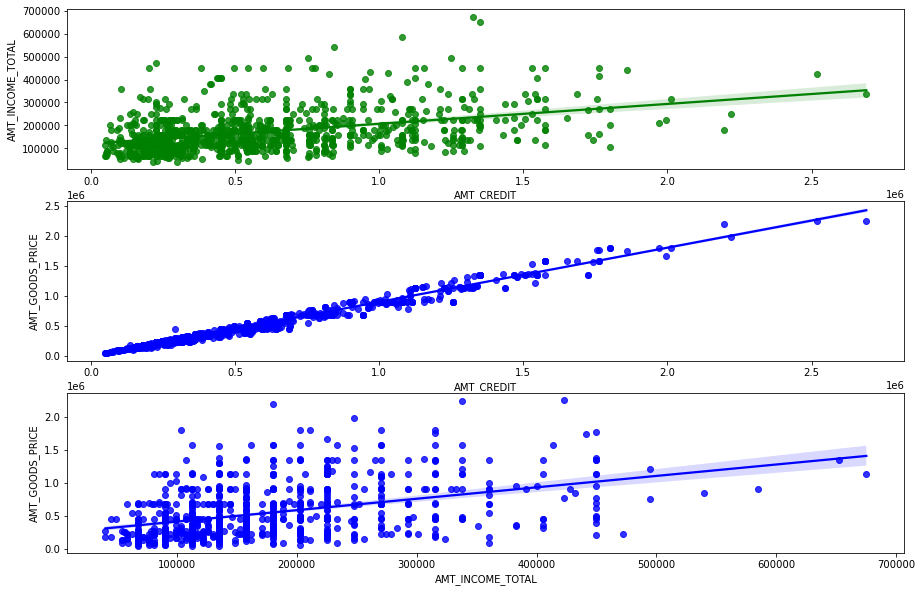

In [ ]:
sample=df.sample(frac=0.01,random_state=1)
print('AMT_CREDIT Correlation AMT_INCOME_TOTAL')
cor=sample['AMT_CREDIT'].corr(sample['AMT_INCOME_TOTAL'])
print('R = ',cor)
print('AMT_CREDIT Correlation AMT_GOODS_PRICE')
cor1=sample['AMT_CREDIT'].corr(sample['AMT_GOODS_PRICE'])
print('R = ',cor1)
print('AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE')
cor2=sample['AMT_INCOME_TOTAL'].corr(sample['AMT_GOODS_PRICE'])
print('R = ',cor2)
fig,ax=plt.subplots(3,1,figsize=(15,10))
sns.regplot(sample['AMT_CREDIT'],sample['AMT_INCOME_TOTAL'],color="g",ax=ax[0])
sns.regplot(sample['AMT_CREDIT'],sample['AMT_GOODS_PRICE'],color="b",ax=ax[1])
sns.regplot(sample['AMT_INCOME_TOTAL'],sample['AMT_GOODS_PRICE'],color="b",ax=ax[2])
plt.show()    

# ‘From the Scatter plot we interpreted the following:
AMT_GOODS_PRICE’ & ‘AMT_CREDIT’& AMT_INCOME_TOTAL  all the have directly proportional relationship with each other (positive Trend)


# Univariate Analysis

C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\si

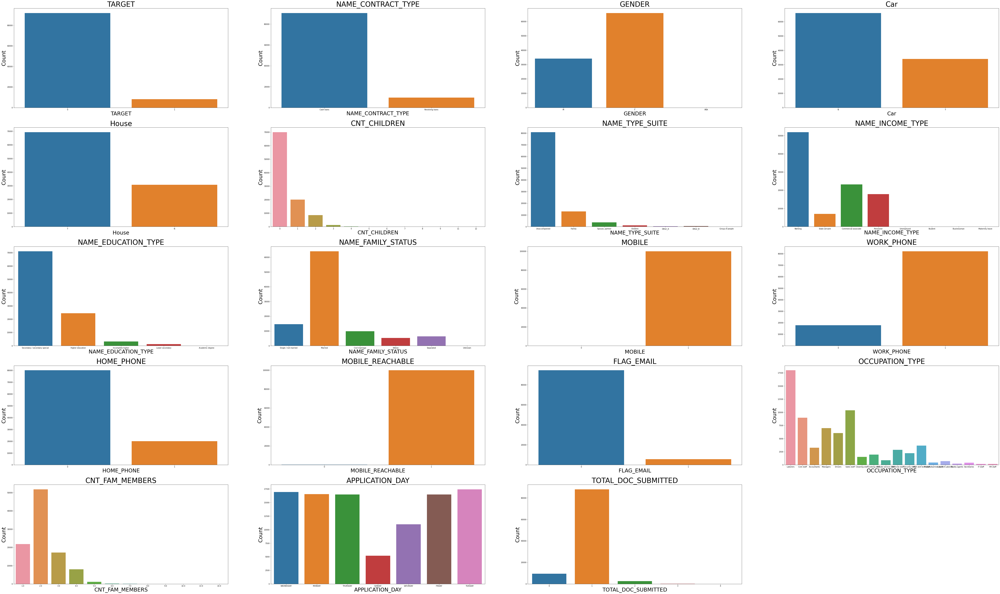

In [ ]:
b1=list(enumerate(cat))
plt.figure(figsize=(100,60))
for x in b1:
#     print(df[x[1]].value_counts().values)
#     print(list(df[x[1]].value_counts().index))
    plt.subplot(5,4,x[0]+1)
    sns.countplot(df[x[1]])
    plt.xlabel(x[1],fontsize=30)
    plt.ylabel('Count',fontsize=30)
    plt.title(f"{x[1]}",fontsize=40)
plt.show()

# Interpretation:                                                                                                        
maximun applicant who applied for loan:                                                                                     
0.TARGET = 0 (maximum applicants are returning the loan without delay)                                                    
1.Name_CONTRACT_TYPE = Cash Loans(maximum Applicants are appliying for cash loan )                                       
2.GENDER             = Female (F)(maximum applicants are female)                                                             
3.Car                = No(N)(maximum applicant don not have the car)                                                         
4.House              = Yes(Y)(maximum applicant have house)                                                                 
5.CNT_CHILDREN       = NO(maximum applicant do not have children)                                                           
6.NAME_TYPE_SUITE    = Unaccompanied                                                                        
7.NAME_INCOME_TYPE   = Working                                                                                      
8.NAME_EDUCATION_TYPE= Secnodary/secondary special                                                               
9.NAME_FAMILY_STATUS = Married                                                                                         
10.MOBILE            = yes(maximum applicant have mobile)                                                                   
11.WORK_PHONE        = Yes(maximum applicant have work phone)                                                               
12.Home_Phone        = No(maximum applicant do not have home phone)                                                         
13.MOBILE_REACHABLE  = Yes(maximum applicant have mobile are reachable)                                                     
14.FLAG_EMAIL        = No(maximum applicant do not have email)                                                               
15.OCCUPATION_TYPE   = Laborers                                                              
16.CNT_FAM_MEMBERS   = (maximum applicant have 2 family members)                                                             
17.TOTAL_DOC_SUBMITTED=1(maximum applicant have submitted one document)  

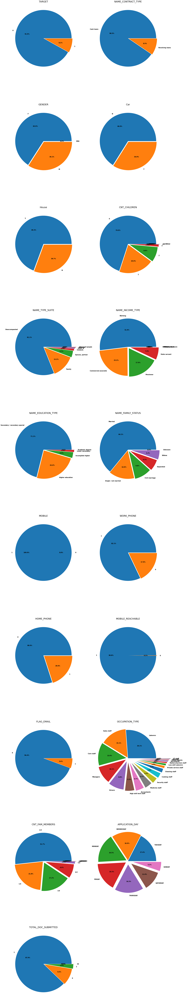

In [ ]:

b1=list(enumerate(cat))
plt.figure(figsize=(30,200))
for x in b1:
#     print(df[x[1]].value_counts().values)
#     print(list(df[x[1]].value_counts().index))
    plt.subplot(10,2,x[0]+1)
    l=[]
    for a in range(df[x[1]].nunique()):
        l.append(a*0.03)
    plt.pie(x = df[x[1]].value_counts(), autopct = "%.1f%%", labels = df[x[1]].value_counts().keys(),explode=l,textprops={'fontsize':15,'fontweight':'bold'})
    plt.title(f"{x[1]}",fontsize=25)
plt.show()

# Interpretation:                                                                                                        
maximun applicant who applied for loan:                                                                                     
0.TARGET = 0 (maximum applicants are returning the loan without delay)                                                    
1.Name_CONTRACT_TYPE = Cash Loans(maximum Applicants are appliying for cash loan )                                       
2.GENDER             = Female (F)(maximum applicants are female)                                                             
3.Car                = No(N)(maximum applicant don not have the car)                                                         
4.House              = Yes(Y)(maximum applicant have house)                                                                 
5.CNT_CHILDREN       = NO(maximum applicant do not have children)                                                           
6.NAME_TYPE_SUITE    = Unaccompanied                                                                        
7.NAME_INCOME_TYPE   = Working                                                                                      
8.NAME_EDUCATION_TYPE= Secnodary/secondary special                                                               
9.NAME_FAMILY_STATUS = Married                                                                                         
10.MOBILE            = yes(maximum applicant have mobile)                                                                   
11.WORK_PHONE        = Yes(maximum applicant have work phone)                                                               
12.Home_Phone        = No(maximum applicant do not have home phone)                                                         
13.MOBILE_REACHABLE  = Yes(maximum applicant have mobile are reachable)                                                     
14.FLAG_EMAIL        = No(maximum applicant do not have email)                                                               
15.OCCUPATION_TYPE   = Laborers                                                              
16.CNT_FAM_MEMBERS   = (maximum applicant have 2 family members)                                                             
17.TOTAL_DOC_SUBMITTED=1(maximum applicant have submitted one document) 

C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


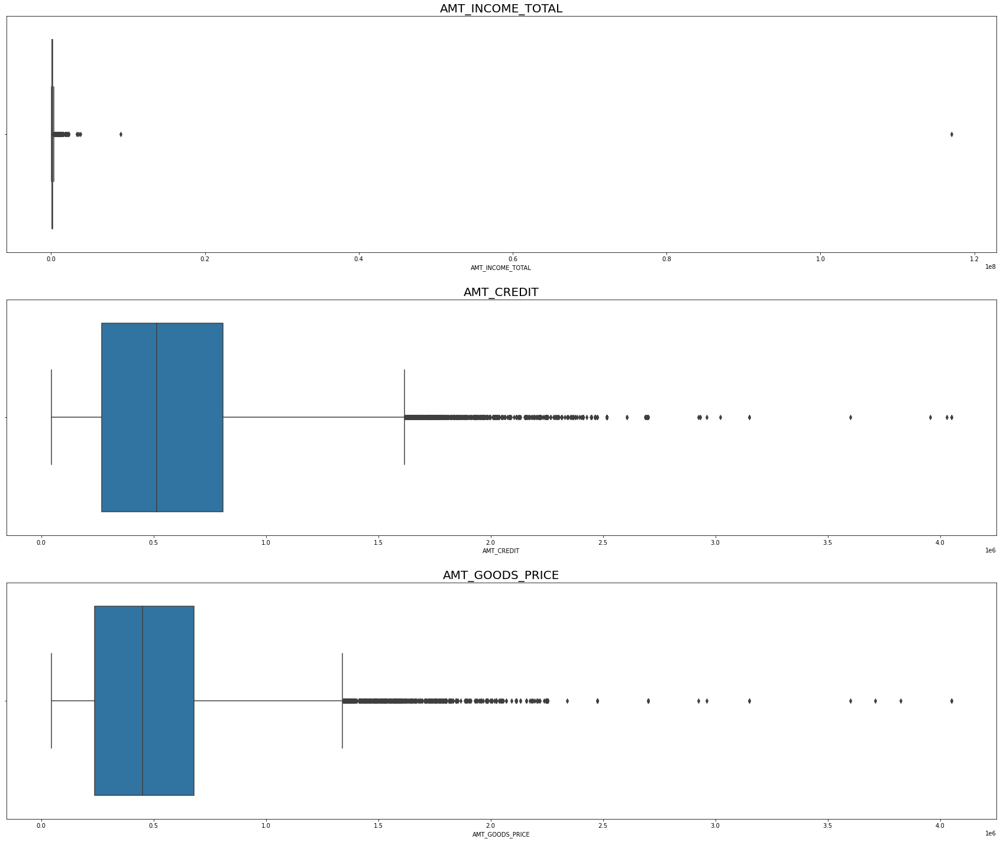

In [ ]:
b1=['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE']
plt.figure(figsize=(30,25))
i=0
for x in b1:
#     print(x)
    i=i+1
    plt.subplot(3,1,i)
    sns.boxplot(df[x])
    plt.title(f"{x}",fontsize=20)
plt.show()

# Bivariate Analysis

In [ ]:
df[cat]=df[cat].fillna('unfilled')

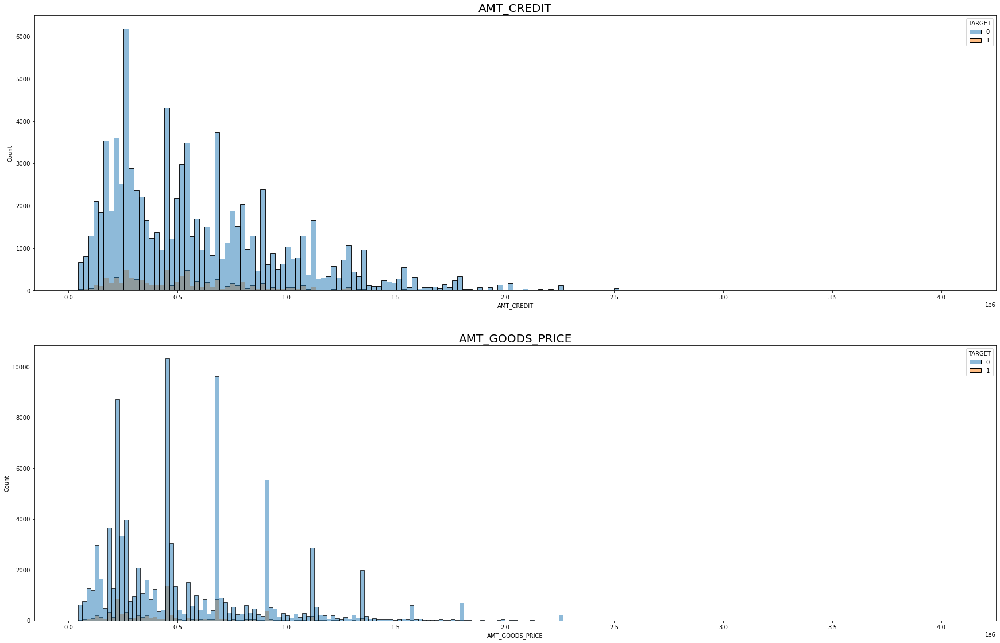

In [ ]:
b1=list(enumerate(['AMT_CREDIT', 'AMT_GOODS_PRICE']))
plt.figure(figsize=(30,30))
for x in b1:
    plt.subplot(3,1,x[0]+1)
    sns.histplot(x=x[1],hue='TARGET',data=df)
    plt.title(f"{x[1]}",fontsize=20)  
plt.show()

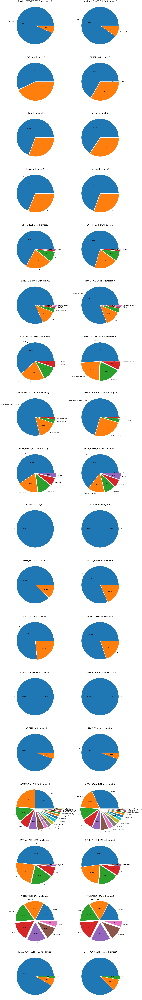

In [ ]:
# Important
b=list(df['TARGET'].unique())
b1=list(enumerate(cat))
plt.figure(figsize=(35,300))
i=0
for x in b1:
#     
#     print(x[1])
    if x[1]!='TARGET':
        for y in b:
            i=i+1
            plt.subplot(18,2,i)
#             print(i)
#             print(df[x[1]][df['TARGET']==y].value_counts().values)
#             print(list(df[x[1]][df['TARGET']==y].value_counts().index))
#             print(df[x[1]].unique())
            l=[]
            for a in range(df[x[1]][df['TARGET']==y].nunique()):
                l.append(a*0.03)
            plt.pie(x=df[x[1]][df['TARGET']==y].value_counts().values,labels=list(df[x[1]][df['TARGET']==y].value_counts().index),autopct="%0.01f%%",explode=l,textprops={'fontsize':20})
            plt.title(f"{x[1]} with target:{y}",fontsize=30)
    else:
        continue
plt.show()

In [ ]:
df.isnull().sum()

SK_ID_CURR              0
TARGET                  0
NAME_CONTRACT_TYPE      0
GENDER                  0
Car                     0
House                   0
CNT_CHILDREN            0
AMT_INCOME_TOTAL        0
AMT_CREDIT              0
AMT_GOODS_PRICE        81
NAME_TYPE_SUITE         0
NAME_INCOME_TYPE        0
NAME_EDUCATION_TYPE     0
NAME_FAMILY_STATUS      0
MOBILE                  0
WORK_PHONE              0
HOME_PHONE              0
MOBILE_REACHABLE        0
FLAG_EMAIL              0
OCCUPATION_TYPE         0
CNT_FAM_MEMBERS         0
APPLICATION_DAY         0
TOTAL_DOC_SUBMITTED     0
dtype: int64

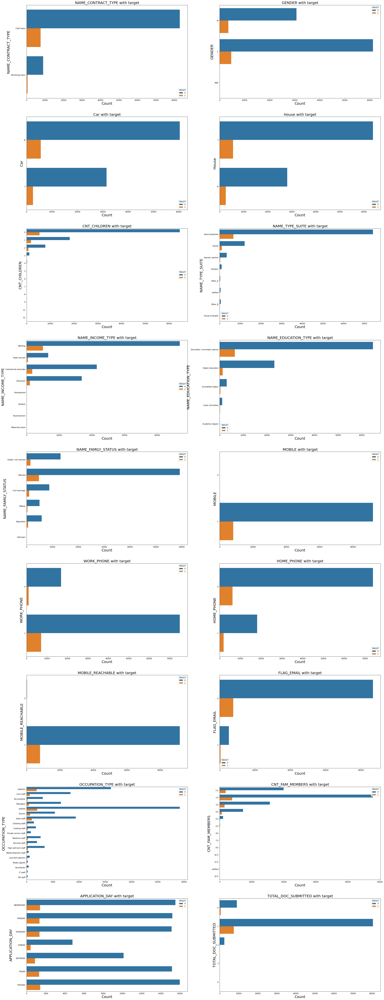

In [ ]:
b=list(df['TARGET'].unique())
b1=list(enumerate(cat))
plt.figure(figsize=(35,100))
for x in b1:
    if x[1]!='TARGET':
        plt.subplot(9,2,x[0])
        sns.countplot(y=df[x[1]],hue=df['TARGET'])
        plt.ylabel(x[1],fontsize=20)
        plt.xlabel('Count',fontsize=20)
        plt.title(f"{x[1]} with target",fontsize=20)
    else:
        continue
plt.show()

# Interpretation :
Applicant with high probability of repayment will be satisfying following condition:                                         
1.Name_CONTRACT_TYPE = Revolving                                                                                            
2.GENDER = Female                                                                                                           
3.Car =Owns a car                                                                                                           
4.House = Owns a house                                                                                                       
5.CNT_CHILDREN = No children                                                                                                 
6.NAME_TYPE_SUITE = unfilled , Group of People                                                                               
7.NAME_INCOME_TYPE = Pensioner                                                                                               
8.NAME_EDUCATION_TYPE= Academic degree, Higher Education                                                                     
9.NAME_FAMILY_STATUS = Widow , Married                                                                                       
10.WORK_PHONE = No(not having work phone)                                                                                   
11.HOME_PHONE = No(not having home phone)                                                                                   
12.MOBILE_REACHABLE = (Contact must be reachable)                                                                           
13.FLAG_EMAIL = Yes(should have email id)                                                                                   
14.OCCUPATION_TYPE = IT staff, Accountants , Secretaries any of these by profession                                         
15.CNT_FAM_MEMBERS =less the 6 family members                                                                               
16.TOTAL_DOC_SUBMITTED=At least one document must be submitted    

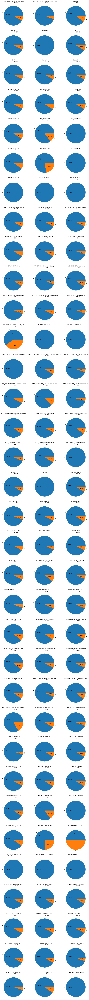

In [ ]:

b1=list(enumerate(cat))
plt.figure(figsize=(20,250))
i=0
for x in b1:
#     print(x[1])
    if x[1]!='TARGET':
        for y in df[x[1]].unique():
#             print(y)
            i=i+1
            plt.subplot(37,3,i)
            plt.pie(x=df['TARGET'][df[x[1]]==y].value_counts().values,labels=df['TARGET'][df[x[1]]==y].value_counts().index,autopct="%0.01f%%",textprops={'fontsize':15})
            plt.title(f'''{x[1]}:{y}
            :{len(df[x[1]][df[x[1]]==y])} ''',fontsize=15)
    else:
        continue
plt.show()

# Interpretation :
Applicant with high probability of repayment will be satisfying following condition:                                         
1.Name_CONTRACT_TYPE = Revolving                                                                                            
2.GENDER = Female                                                                                                           
3.Car =Owns a car                                                                                                           
4.House = Owns a house                                                                                                       
5.CNT_CHILDREN = No children                                                                                                 
6.NAME_TYPE_SUITE = unfilled , Group of People                                                                               
7.NAME_INCOME_TYPE = Pensioner                                                                                               
8.NAME_EDUCATION_TYPE= Academic degree, Higher Education                                                                     
9.NAME_FAMILY_STATUS = Widow , Married                                                                                       
10.WORK_PHONE = No(not having work phone)                                                                                   
11.HOME_PHONE = No(not having home phone)                                                                                   
12.MOBILE_REACHABLE = (Contact must be reachable)                                                                           
13.FLAG_EMAIL = Yes(should have email id)                                                                                   
14.OCCUPATION_TYPE = IT staff, Accountants , Secretaries any of these by profession                                         
15.CNT_FAM_MEMBERS =less the 6 family members                                                                               
16.TOTAL_DOC_SUBMITTED=At least one document must be submitted                                                               
                                                                                         

# Without outlier

In [ ]:
df1=df

In [ ]:
def outlier_treat(x):
    q1=df1[x].describe()[4]
    q3=df1[x].describe()[6]
    iqr=q3-q1
    uf=q3+(1.5*iqr)
    lf=q1-(1.5*iqr)
    out=[]
    outind=[]
    out=[a for a in df1[x] if ((a<lf)|(a>uf))]
    outind=df1.index[df1[x].isin(out)]
    return outind

In [ ]:
choice=['AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE']
print(df1.shape)
for x in choice:
    df1=df1.drop(outlier_treat(x))
print(df1.shape)

(100000, 23)
(91582, 23)


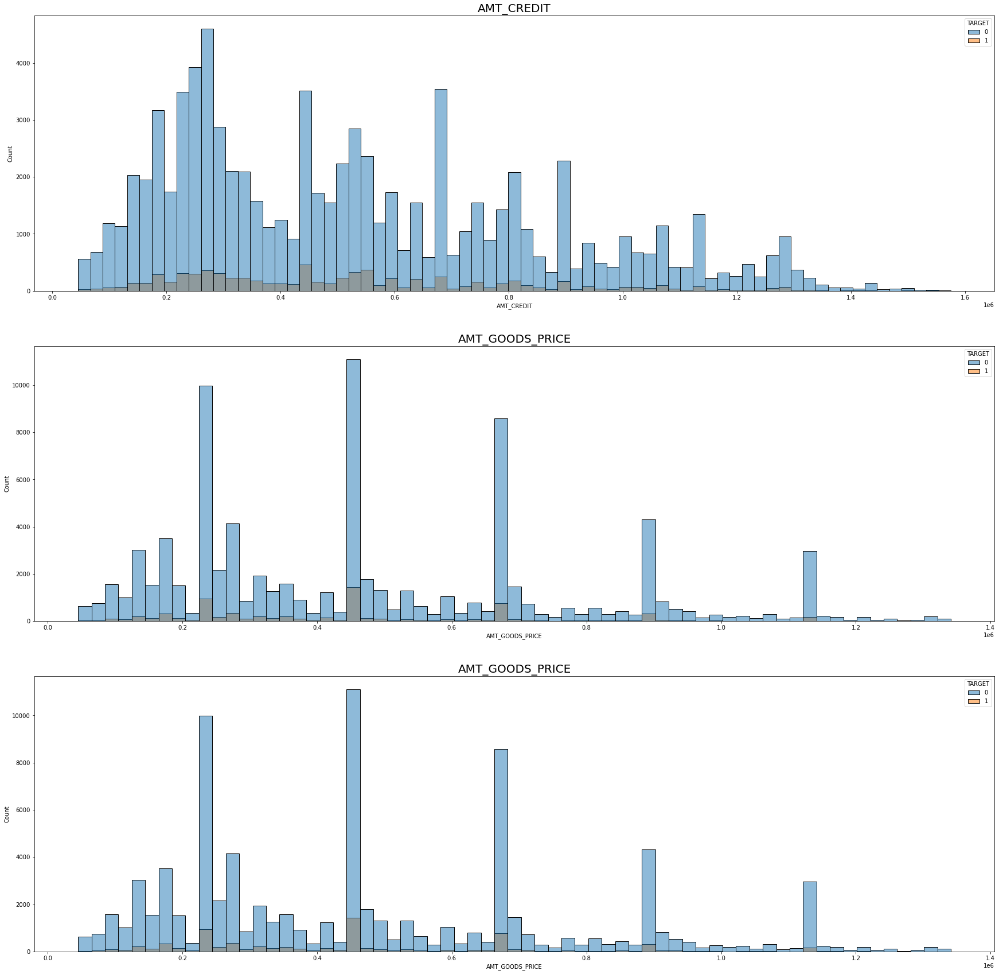

In [ ]:
b1=list(enumerate(['AMT_CREDIT', 'AMT_GOODS_PRICE', 'AMT_GOODS_PRICE']))
plt.figure(figsize=(30,30))
for x in b1:
    plt.subplot(3,1,x[0]+1)
    sns.histplot(x=x[1],hue='TARGET',data=df1)
    plt.title(f"{x[1]}",fontsize=20)  
plt.show()

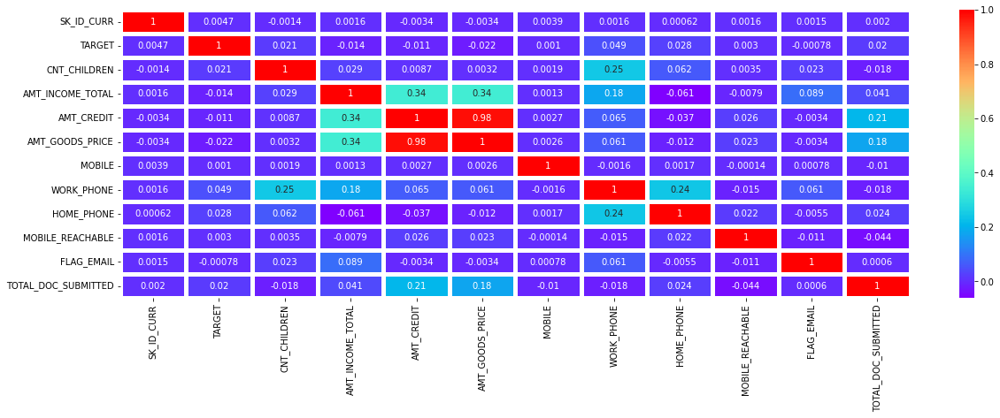

In [ ]:
fig,ax=plt.subplots(figsize=(20,6))
sns.heatmap(df1.corr(),cmap='rainbow',annot=True,linewidth=5)
plt.show()

# From the Heat map we interpreted the following:
Strong positive  relation between (‘AMT_GOODS_PRICE’ & ‘AMT_CREDIT’)  
Positive relation between(‘CNT_CHIDREN’&’WORK_PHONE’)  ,(‘WORK_PHONE&HOME_PHONE’),(TOTAL_DOC_SUBMITTED& ‘AMT_CREDIT’& ‘AMT_GOODS_PRICE’) )


AMT_CREDIT Correlation AMT_INCOME_TOTAL
R =  0.38009864496429413
AMT_CREDIT Correlation AMT_GOODS_PRICE
R =  0.970378279129
AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE
R =  0.3780972666131676


AMT_CREDIT Correlation AMT_INCOME_TOTAL
R =  0.32093087074744026
AMT_CREDIT Correlation AMT_GOODS_PRICE
R =  0.9834985975117545
AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE
R =  0.314519228047402


C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anacond

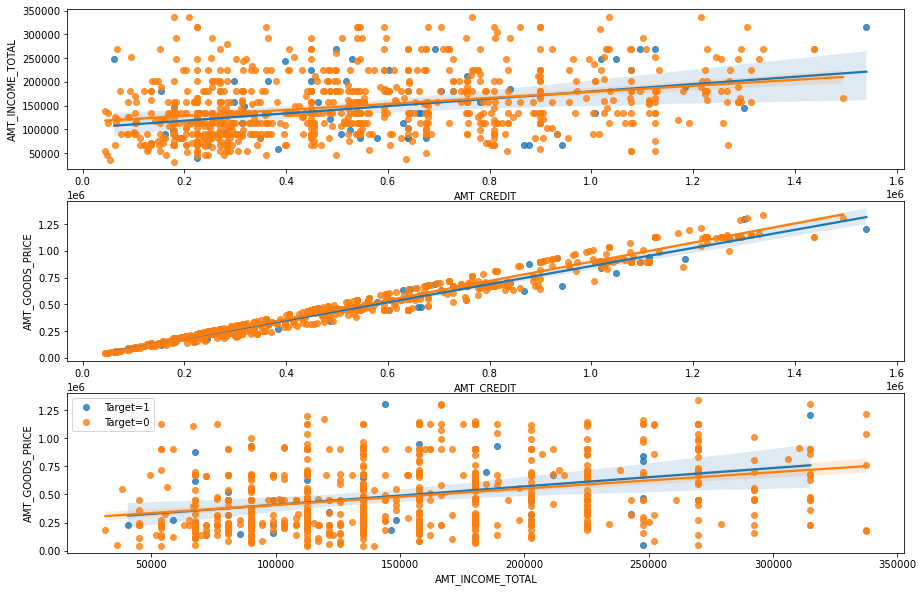

In [ ]:
df1_0=df1[df1['TARGET']==0]
df1_1=df1[df1['TARGET']==1]
sample_0=df1_0.sample(frac=0.01,random_state=1)
sample_1=df1_1.sample(frac=0.01,random_state=1)
print('AMT_CREDIT Correlation AMT_INCOME_TOTAL')
cor_1=sample_1['AMT_CREDIT'].corr(sample_1['AMT_INCOME_TOTAL'])
print('R = ',cor_1)
print('AMT_CREDIT Correlation AMT_GOODS_PRICE')
cor1_1=sample_1['AMT_CREDIT'].corr(sample_1['AMT_GOODS_PRICE'])
print('R = ',cor1_1)
print('AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE')
cor2_1=sample_1['AMT_INCOME_TOTAL'].corr(sample_1['AMT_GOODS_PRICE'])
print('R = ',cor2_1)
print('\n')
print('AMT_CREDIT Correlation AMT_INCOME_TOTAL')
cor_0=sample_0['AMT_CREDIT'].corr(sample_0['AMT_INCOME_TOTAL'])
print('R = ',cor_0)
print('AMT_CREDIT Correlation AMT_GOODS_PRICE')
cor1_0=sample_0['AMT_CREDIT'].corr(sample_0['AMT_GOODS_PRICE'])
print('R = ',cor1_0)
print('AMT_INCOME_TOTAL Correlation AMT_GOODS_PRICE')
cor2_0=sample_0['AMT_INCOME_TOTAL'].corr(sample_0['AMT_GOODS_PRICE'])
print('R = ',cor2_0)
fig,ax=plt.subplots(3,1,figsize=(15,10))
sns.regplot(sample_1['AMT_CREDIT'],sample_1['AMT_INCOME_TOTAL'],ax=ax[0],label='Target=1')
sns.regplot(sample_1['AMT_CREDIT'],sample_1['AMT_GOODS_PRICE'],ax=ax[1],label='Target=1')
sns.regplot(sample_1['AMT_INCOME_TOTAL'],sample_1['AMT_GOODS_PRICE'],ax=ax[2],label='Target=1')
sns.regplot(sample_0['AMT_CREDIT'],sample_0['AMT_INCOME_TOTAL'],ax=ax[0],label='Target=0')
sns.regplot(sample_0['AMT_CREDIT'],sample_0['AMT_GOODS_PRICE'],ax=ax[1],label='Target=0')
sns.regplot(sample_0['AMT_INCOME_TOTAL'],sample_0['AMT_GOODS_PRICE'],ax=ax[2],label='Target=0')
plt.legend()
plt.show()

# From the Scatter plot we interpreted the following:
AMT_GOODS_PRICE’ & ‘AMT_CREDIT’& AMT_INCOME_TOTAL  all the have directly proportional relationship with each other (positive Trend)


# Univariate Analysis

C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\krish\anaconda3\lib\si

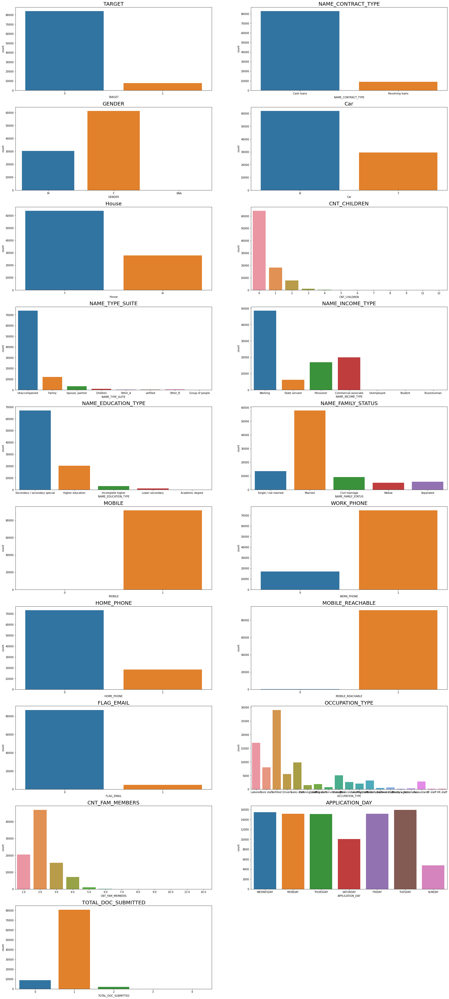

In [ ]:
b1=list(enumerate(cat))
plt.figure(figsize=(30,70))
for x in b1:
    plt.subplot(10,2,x[0]+1)
    sns.countplot(df1[x[1]])
    plt.title(f"{x[1]}",fontsize=20)
plt.show()

# Interpretation:                                                                                                        
maximun applicant who applied for loan:                                                                                     
0.TARGET = 0 (maximum applicants are returning the loan without delay)                                                    
1.Name_CONTRACT_TYPE = Cash Loans(maximum Applicants are appliying for cash loan )                                       
2.GENDER             = Female (F)(maximum applicants are female)                                                             
3.Car                = No(N)(maximum applicant don not have the car)                                                         
4.House              = Yes(Y)(maximum applicant have house)                                                                 
5.CNT_CHILDREN       = NO(maximum applicant do not have children)                                                           
6.NAME_TYPE_SUITE    = Unaccompanied                                                                        
7.NAME_INCOME_TYPE   = Working                                                                                      
8.NAME_EDUCATION_TYPE= Secnodary/secondary special                                                               
9.NAME_FAMILY_STATUS = Married                                                                                         
10.MOBILE            = yes(maximum applicant have mobile)                                                                   
11.WORK_PHONE        = Yes(maximum applicant have work phone)                                                               
12.Home_Phone        = No(maximum applicant do not have home phone)                                                         
13.MOBILE_REACHABLE  = Yes(maximum applicant have mobile are reachable)                                                     
14.FLAG_EMAIL        = No(maximum applicant do not have email)                                                               
15.OCCUPATION_TYPE   = Laborers                                                              
16.CNT_FAM_MEMBERS   = (maximum applicant have 2 family members)                                                             
17.TOTAL_DOC_SUBMITTED=1(maximum applicant have submitted one document) 

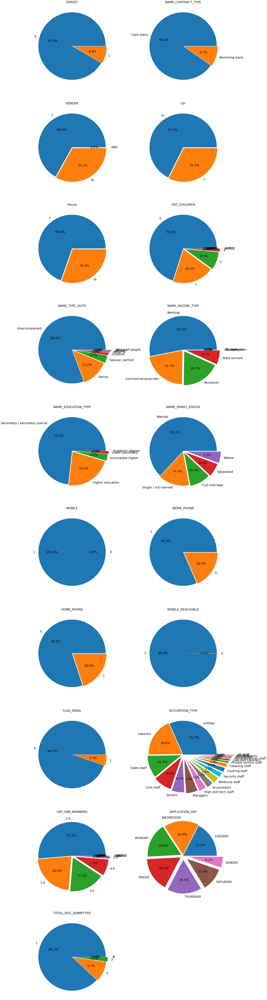

In [ ]:
b1=list(enumerate(cat))
plt.figure(figsize=(30,150))
for x in b1:
#     print(df[x[1]].value_counts().values)
#     print(list(df[x[1]].value_counts().index))
    plt.subplot(10,2,x[0]+1)
    l=[]
    for a in range(df1[x[1]].nunique()):
        l.append(a*0.03)
    plt.pie(x = df1[x[1]].value_counts(), autopct = "%.1f%%", labels = df1[x[1]].value_counts().keys(),explode=l,textprops={'fontsize':25})
    plt.title(f"{x[1]}",fontsize=25)
plt.show()

# Interpretation:                                                                                                        
maximun applicant who applied for loan:                                                                                     
0.TARGET = 0 (maximum applicants are returning the loan without delay)                                                    
1.Name_CONTRACT_TYPE = Cash Loans(maximum Applicants are appliying for cash loan )                                       
2.GENDER             = Female (F)(maximum applicants are female)                                                             
3.Car                = No(N)(maximum applicant don not have the car)                                                         
4.House              = Yes(Y)(maximum applicant have house)                                                                 
5.CNT_CHILDREN       = NO(maximum applicant do not have children)                                                           
6.NAME_TYPE_SUITE    = Unaccompanied                                                                        
7.NAME_INCOME_TYPE   = Working                                                                                      
8.NAME_EDUCATION_TYPE= Secnodary/secondary special                                                               
9.NAME_FAMILY_STATUS = Married                                                                                         
10.MOBILE            = yes(maximum applicant have mobile)                                                                   
11.WORK_PHONE        = Yes(maximum applicant have work phone)                                                               
12.Home_Phone        = No(maximum applicant do not have home phone)                                                         
13.MOBILE_REACHABLE  = Yes(maximum applicant have mobile are reachable)                                                     
14.FLAG_EMAIL        = No(maximum applicant do not have email)                                                               
15.OCCUPATION_TYPE   = Unfilled                                                              
16.CNT_FAM_MEMBERS   = (maximum applicant have 2 family members)                                                             
17.TOTAL_DOC_SUBMITTED=1(maximum applicant have submitted one document) 

# Bivariate Analysis

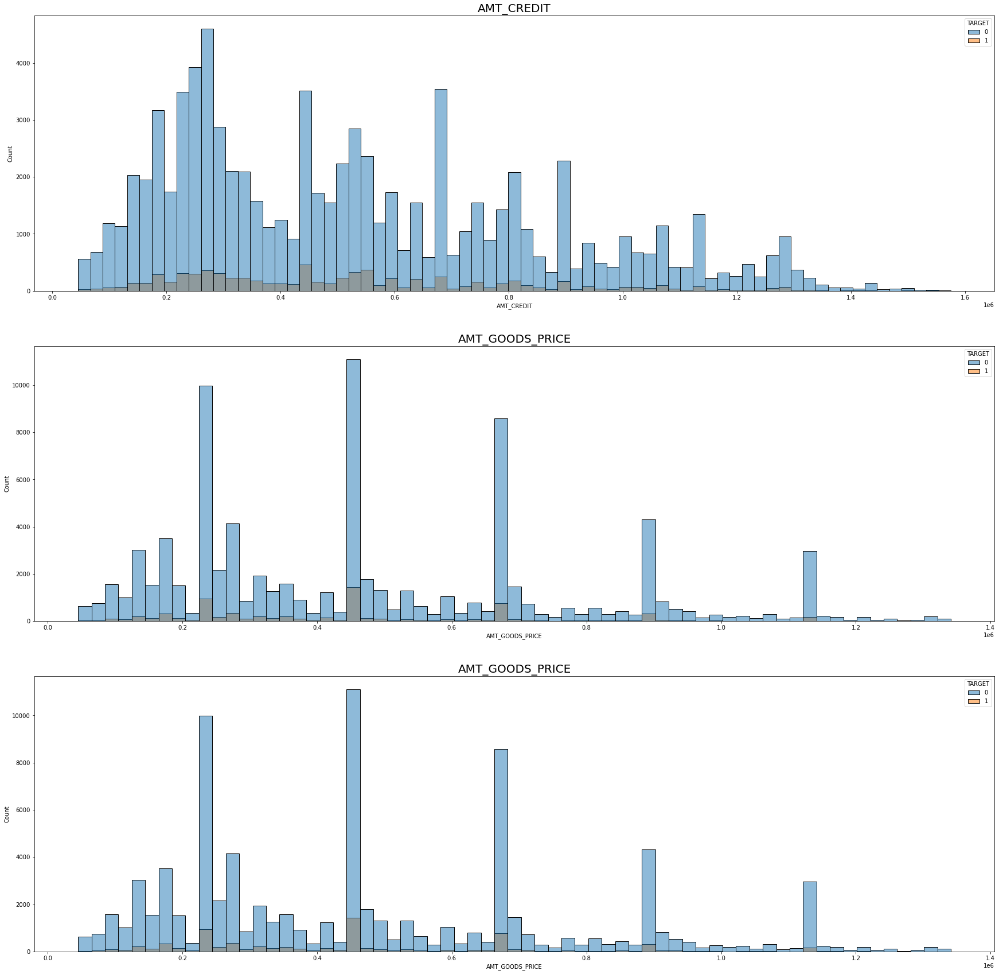

In [ ]:
b1=list(enumerate(['AMT_CREDIT', 'AMT_GOODS_PRICE', 'AMT_GOODS_PRICE']))
plt.figure(figsize=(30,30))
for x in b1:
    plt.subplot(3,1,x[0]+1)
    sns.histplot(x=x[1],hue='TARGET',data=df1)
    plt.title(f"{x[1]}",fontsize=20)  
plt.show()

# Right skewed

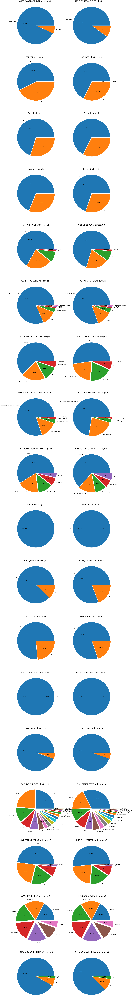

In [ ]:
# Important
b=list(df1['TARGET'].unique())
b1=list(enumerate(cat))
plt.figure(figsize=(30,300))
i=0
for x in b1:
#     
#     print(x[1])
    if x[1]!='TARGET':
        for y in b:
            i=i+1
            plt.subplot(18,2,i)
#             print(i)
#             print(df[x[1]][df['TARGET']==y].value_counts().values)
#             print(list(df[x[1]][df['TARGET']==y].value_counts().index))
#             print(df[x[1]].unique())
            l=[]
            for a in range(df1[x[1]][df['TARGET']==y].nunique()):
                l.append(a*0.03)
            plt.pie(x=df1[x[1]][df1['TARGET']==y].value_counts().values,labels=list(df1[x[1]][df1['TARGET']==y].value_counts().index),autopct="%0.01f%%",explode=l,textprops={'fontsize':20})
            plt.title(f"{x[1]} with target:{y}",fontsize=30)
    else:
        continue
plt.show()

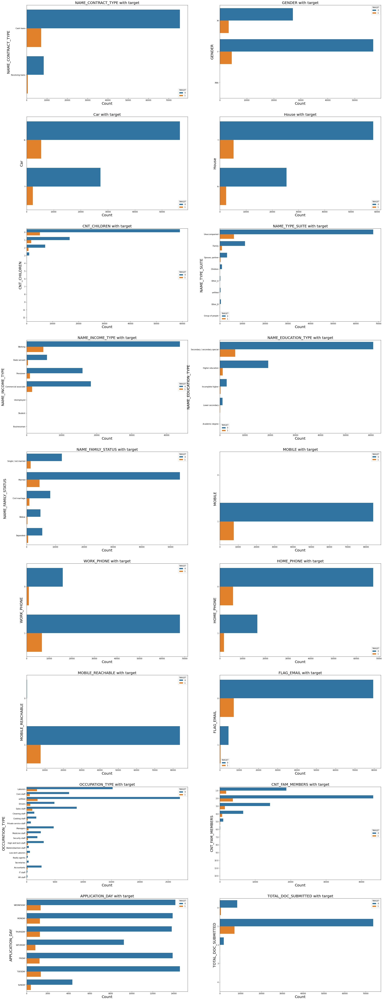

In [ ]:
b=list(df1['TARGET'].unique())
b1=list(enumerate(cat))
plt.figure(figsize=(35,100))
for x in b1:
    if x[1]!='TARGET':
        plt.subplot(9,2,x[0])
        sns.countplot(y=df1[x[1]],hue=df1['TARGET'])
        plt.ylabel(x[1],fontsize=20)
        plt.xlabel('Count',fontsize=20)
        plt.title(f"{x[1]} with target",fontsize=20)
    else:
        continue
plt.show()

# Interpretation :
Applicant with high probability of repayment will be satisfying following condition:                                         
1.Name_CONTRACT_TYPE = Revolving                                                                                            
2.GENDER = Female                                                                                                           
3.Car =Owns a car                                                                                                           
4.House = Owns a house                                                                                                       
5.CNT_CHILDREN = No children                                                                                                 
6.NAME_TYPE_SUITE = unfilled , Group of People                                                                               
7.NAME_INCOME_TYPE = Pensioner                                                                                               
8.NAME_EDUCATION_TYPE= Academic degree, Higher Education                                                                     
9.NAME_FAMILY_STATUS = Widow , Married                                                                                       
10.WORK_PHONE = No(not having work phone)                                                                                   
11.HOME_PHONE = No(not having home phone)                                                                                   
12.MOBILE_REACHABLE = (Contact must be reachable)                                                                           
13.FLAG_EMAIL = Yes(should have email id)                                                                                   
14.OCCUPATION_TYPE = IT staff, Accountants , Secretaries any of these by profession                                         
15.CNT_FAM_MEMBERS =less the 6 family members                                                                               
16.TOTAL_DOC_SUBMITTED=At least one document must be submitted  

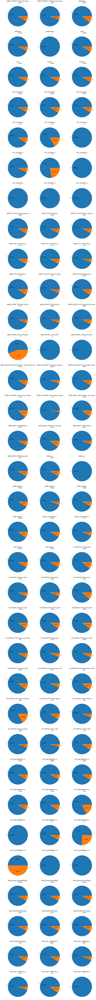

In [ ]:

b1=list(enumerate(cat))
plt.figure(figsize=(20,250))
i=0
for x in b1:
#     print(x[1])
    if x[1]!='TARGET':
        for y in df1[x[1]].unique():
#             print(y)
            i=i+1
            plt.subplot(37,3,i)
            plt.pie(x=df1['TARGET'][df1[x[1]]==y].value_counts().values,labels=df1['TARGET'][df1[x[1]]==y].value_counts().index,autopct="%0.01f%%",textprops={'fontsize':15})
            plt.title(f'''{x[1]}:{y}:
            {len(df1[x[1]][df1[x[1]]==y])}''',fontsize=15)
    else:
        continue
plt.show()

# Interpretation :
Applicant with high probability of repayment will be satisfying following condition:                                         
1.Name_CONTRACT_TYPE = Revolving                                                                                            
2.GENDER = Female                                                                                                           
3.Car =Owns a car                                                                                                           
4.House = Owns a house                                                                                                       
5.CNT_CHILDREN = No children                                                                                                 
6.NAME_TYPE_SUITE = unfilled , Group of People                                                                               
7.NAME_INCOME_TYPE = Pensioner                                                                                               
8.NAME_EDUCATION_TYPE= Academic degree, Higher Education                                                                     
9.NAME_FAMILY_STATUS = Widow , Married                                                                                       
10.WORK_PHONE = No(not having work phone)                                                                                   
11.HOME_PHONE = No(not having home phone)                                                                                   
12.MOBILE_REACHABLE = (Contact must be reachable)                                                                           
13.FLAG_EMAIL = Yes(should have email id)                                                                                   
14.OCCUPATION_TYPE = IT staff, Accountants , Secretaries any of these by profession                                         
15.CNT_FAM_MEMBERS =less the 6 family members                                                                               
16.TOTAL_DOC_SUBMITTED=At least one document must be submitted  

# Prescription :
### Few interpretations are manupulated after analysis the data
Kindly do the thorough inspection for the applicant who satisfying following condition:                                         
1.Name_CONTRACT_TYPE = cash loan                                                                                            
2.GENDER = Male                                                                                                           
3.Car =Not owns a car                                                                                                       
4.House =Not Owns a house                                                                                                   
5.CNT_CHILDREN = Have children                                                                                               
6.NAME_TYPE_SUITE = Other B                                                                                                 
7.NAME_INCOME_TYPE = Unemployed                                                                                             
8.NAME_EDUCATION_TYPE= Lower Secondary                                                                     
9.NAME_FAMILY_STATUS = Not Married or Civil Marriage                                                                         
10.WORK_PHONE = No(not having work phone)                                                                                   
11.HOME_PHONE = No(not having home phone)                                                                                   
12.MOBILE_REACHABLE = NO(Contact is not reachable)                                                                           
13.FLAG_EMAIL = No(Not have email id)                                                                                   
14.OCCUPATION_TYPE = Lower skill Laborers                                                                                   
15.CNT_FAM_MEMBERS =More then 6 family members                                                                               
16.TOTAL_DOC_SUBMITTED=Not submitted any document   

In [ ]:
Final=df
Final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 23 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   SK_ID_CURR           100000 non-null  int64  
 1   TARGET               100000 non-null  int64  
 2   NAME_CONTRACT_TYPE   100000 non-null  object 
 3   GENDER               100000 non-null  object 
 4   Car                  100000 non-null  object 
 5   House                100000 non-null  object 
 6   CNT_CHILDREN         100000 non-null  int64  
 7   AMT_INCOME_TOTAL     100000 non-null  float64
 8   AMT_CREDIT           100000 non-null  float64
 9   AMT_GOODS_PRICE      99919 non-null   float64
 10  NAME_TYPE_SUITE      100000 non-null  object 
 11  NAME_INCOME_TYPE     100000 non-null  object 
 12  NAME_EDUCATION_TYPE  100000 non-null  object 
 13  NAME_FAMILY_STATUS   100000 non-null  object 
 14  MOBILE               100000 non-null  int64  
 15  WORK_PHONE        

In [ ]:
Final.columns

Index(['SK_ID_CURR', 'TARGET', 'NAME_CONTRACT_TYPE', 'GENDER', 'Car', 'House',
       'CNT_CHILDREN', 'AMT_INCOME_TOTAL', 'AMT_CREDIT', 'AMT_GOODS_PRICE',
       'NAME_TYPE_SUITE', 'NAME_INCOME_TYPE', 'NAME_EDUCATION_TYPE',
       'NAME_FAMILY_STATUS', 'MOBILE', 'WORK_PHONE', 'HOME_PHONE',
       'MOBILE_REACHABLE', 'FLAG_EMAIL', 'OCCUPATION_TYPE', 'CNT_FAM_MEMBERS',
       'APPLICATION_DAY', 'TOTAL_DOC_SUBMITTED'],
      dtype='object')

In [ ]:
f=Final['CNT_FAM_MEMBERS'].unique()

In [ ]:
Final=Final[(Final['OCCUPATION_TYPE']!='Low-skill Laborers')]
Final=Final[(Final['TOTAL_DOC_SUBMITTED']!=0)]
Final=Final[(Final['NAME_INCOME_TYPE']!='Unemployed')]
Final=Final[(Final['Car']=='Y')|(Final['House']=='Y')]
Final=Final[(Final['NAME_FAMILY_STATUS']!='Civil Marriage')]
Final=Final[(Final['MOBILE_REACHABLE']==1)]
Final=Final[(Final['MOBILE']==1)|(Final['FLAG_EMAIL']==1)|(Final['HOME_PHONE']==1)|(Final['FLAG_EMAIL']==1)]
Final=Final[(Final['CNT_FAM_MEMBERS']==f[0])|(Final['CNT_FAM_MEMBERS']==f[1])|(Final['CNT_FAM_MEMBERS']==f[2])|(Final['CNT_FAM_MEMBERS']==f[3])|(Final['CNT_FAM_MEMBERS']==f[4])]
Final.shape

(70751, 23)

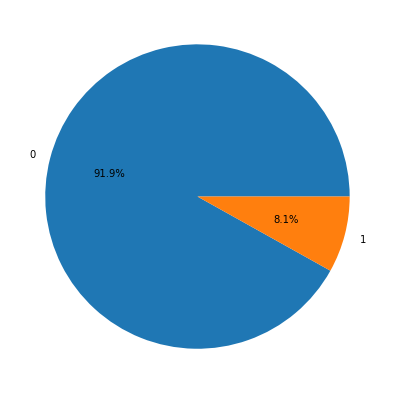

In [ ]:
fig,ax=plt.subplots(figsize=(15,7))
plt.pie(x=Final['TARGET'].value_counts().values,labels=Final['TARGET'].value_counts().index,autopct="%0.01f%%")
plt.show()

In [ ]:
Final.to_excel('who_deserve_loan.xlsx')